#Python Notebook 3:  Mortality Status ensemble classifier with its base learners’ performances and Survival Months regression Decision Trees

Seminar session 1 and 2

In [280]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Seminar session 1 and 2

In [281]:
import pandas as pd

data_frame = pd.read_csv('/content/drive/MyDrive/Classification_dataset.csv')

Seminar session 1 and 2

In [282]:
#Check updated unique value counts
print(data_frame["Mortality_Status"].value_counts())

Mortality_Status
0    3408
1     616
Name: count, dtype: int64


Seminar session 1 and 2

In [283]:
data_frame.head()

,Age,Sex,T_Stage,N_Stage,6th_Stage,Differentiated,Grade,A_Stage,Tumor_Size,Estrogen_Status,Progesterone_Status,Regional_Node_Examined,Regional_Node_Positive,Mortality_Status
0,68.0,0,0,0,0,1,3,1,4.0,1,1,24.0,1,0
1,50.0,0,1,1,2,0,2,1,35.0,1,1,14.0,5,0
2,58.0,0,2,2,4,0,2,1,63.0,1,1,14.0,7,0
3,58.0,0,0,0,0,1,3,1,18.0,1,1,2.0,1,0
4,47.0,0,1,0,1,1,3,1,41.0,1,1,3.0,1,0


Seminar session 3

In [284]:
#Targeting the 'Mortality_Status'
X = data_frame.drop(columns=["Mortality_Status"])
y = data_frame["Mortality_Status"]

Seminar session 3

In [285]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

#Spliting data for training(80%) and testing(20%)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

Seminar session 3

In [286]:
#Feature scaling for KNN & Logistic Regression
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

Seminar session 1, 2, 3, 4

In [287]:
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, r2_score, f1_score

#Train Naive Bayes model
nb = GaussianNB()
nb.fit(X_train, y_train)

#Predict
y_pred_nb = nb.predict(X_test)

Seminar session 1, 2, 3, 4

In [288]:
#Performance evaluation
print("Naive Bayes Classification Report:\n", classification_report(y_test, y_pred_nb))
print("Naive Bayes Accuracy:", accuracy_score(y_test, y_pred_nb))
print("Naive Bayes Confusion Matrix:\n", confusion_matrix(y_test, y_pred_nb))

Naive Bayes Classification Report:
               precision    recall  f1-score   support

           0       0.88      0.86      0.87       682
           1       0.32      0.37      0.35       123

    accuracy                           0.78       805
   macro avg       0.60      0.62      0.61       805
weighted avg       0.80      0.78      0.79       805

Naive Bayes Accuracy: 0.7838509316770186
Naive Bayes Confusion Matrix:
 [[585  97]
 [ 77  46]]


Seminar session 3

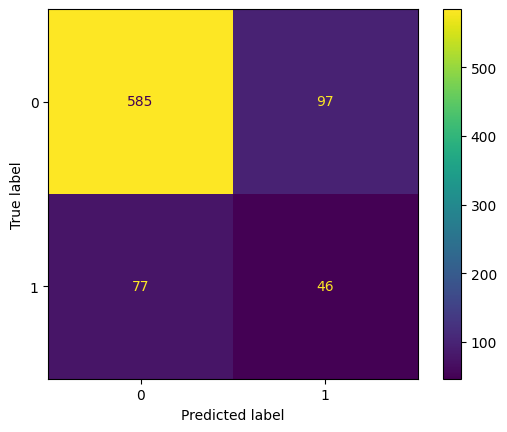

In [289]:
from sklearn.metrics import ConfusionMatrixDisplay

#Construct the confusion matrix
cm = confusion_matrix(y_test, y_pred_nb, labels=nb.classes_)

#Creating display
display = ConfusionMatrixDisplay(cm, display_labels=nb.classes_)
display.plot()

Seminar session 3

In [290]:
from sklearn.linear_model import LogisticRegression

#Train Logistic Regression model
logreg = LogisticRegression()
logreg.fit(X_train, y_train)

#Predict
y_pred_logreg = logreg.predict(X_test)

Seminar session 1, 2, 3, 4

In [291]:
#Performance evaluation
print("Logistic Regression Classification Report:\n", classification_report(y_test, y_pred_logreg))
print("Logistic Regression Accuracy:", accuracy_score(y_test, y_pred_logreg))
print("Logistic Regression Confusion Matrix:\n", confusion_matrix(y_test, y_pred_logreg))

Logistic Regression Classification Report:
               precision    recall  f1-score   support

           0       0.86      0.99      0.92       682
           1       0.62      0.12      0.20       123

    accuracy                           0.85       805
   macro avg       0.74      0.55      0.56       805
weighted avg       0.83      0.85      0.81       805

Logistic Regression Accuracy: 0.8546583850931677
Logistic Regression Confusion Matrix:
 [[673   9]
 [108  15]]


Seminar session 3

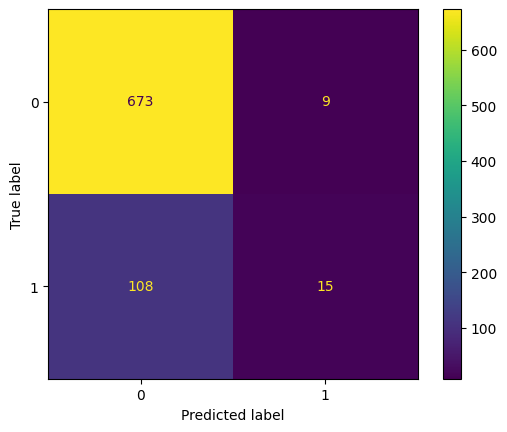

In [292]:
#Construct the confusion matrix
cm = confusion_matrix(y_test, y_pred_logreg, labels=logreg.classes_)

#Creating display
display = ConfusionMatrixDisplay(cm, display_labels=logreg.classes_)
display.plot()

Seminar session 4

In [293]:
from sklearn.neighbors import KNeighborsClassifier

#Train KNN model with k=5
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train, y_train)

#Predict
y_pred_knn = knn.predict(X_test)

Seminar session 1, 2, 3, 4

In [294]:
#Performance evaluation
print("KNN Classification Report:\n", classification_report(y_test, y_pred_knn))
print("KNN Accuracy:", accuracy_score(y_test, y_pred_knn))
print("KNN Confusion Matrix:\n", confusion_matrix(y_test, y_pred_knn))

KNN Classification Report:
               precision    recall  f1-score   support

           0       0.86      0.95      0.90       682
           1       0.31      0.14      0.19       123

    accuracy                           0.82       805
   macro avg       0.59      0.54      0.55       805
weighted avg       0.78      0.82      0.79       805

KNN Accuracy: 0.822360248447205
KNN Confusion Matrix:
 [[645  37]
 [106  17]]


Seminar session 3

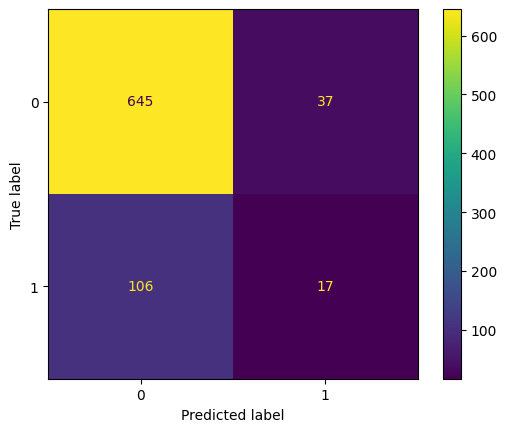

In [295]:
#Construct the confusion matrix
cm = confusion_matrix(y_test, y_pred_knn, labels=knn.classes_)

#Creating display
display = ConfusionMatrixDisplay(cm, display_labels=knn.classes_)
display.plot()

Seminar session 4

In [296]:
#Defining hyperparameters
from sklearn.model_selection import GridSearchCV
import numpy as np

#Naive Bayes
#Define the parameter grid
param_grid_nb = {
    'var_smoothing': np.logspace(-9, 0, 10)
}

#Instantiate GridSearchCV
nb_gscv = GridSearchCV(GaussianNB(), param_grid_nb, cv=5, scoring='accuracy')

#Fit to the data
nb_gscv.fit(X_train, y_train)


GridSearchCV(cv=5, estimator=GaussianNB(),
             param_grid={'var_smoothing': array([1.e-09, 1.e-08, 1.e-07, 1.e-06, 1.e-05, 1.e-04, 1.e-03, 1.e-02,
       1.e-01, 1.e+00])},
             scoring='accuracy')

Seminar session 4

In [297]:
#Logistic Regression
#Define the parameter grid
param_grid_logreg = {
    'C': [0.01, 0.1, 1, 10, 100], 'solver': ['liblinear', 'lbfgs']
}

#Instantiate GridSearchCV
logreg_gscv = GridSearchCV(LogisticRegression(), param_grid_logreg, cv=5, scoring='accuracy')

#Fit to the data
logreg_gscv.fit(X_train, y_train)


GridSearchCV(cv=5, estimator=LogisticRegression(),
             param_grid={'C': [0.01, 0.1, 1, 10, 100],
                         'solver': ['liblinear', 'lbfgs']},
             scoring='accuracy')

Seminar session 4

In [298]:
#KNN
#Define the parameter grid
param_grid_knn = {
    'n_neighbors': np.arange(1, 25), 'metric': ['euclidean', 'manhattan']
}

#Instantiate GridSearchCV
knn_gscv = GridSearchCV(KNeighborsClassifier(), param_grid_knn, cv=5, scoring='accuracy')

#Fit to the data
knn_gscv.fit(X_train, y_train)


GridSearchCV(cv=5, estimator=KNeighborsClassifier(),
             param_grid={'metric': ['euclidean', 'manhattan'],
                         'n_neighbors': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24])},
             scoring='accuracy')

Seminar session 4

In [299]:
#Print the best parameters
print("Best parameters for Naive Bayes:", nb_gscv.best_params_)
best_nb = nb_gscv.best_estimator_
print("\nBest parameters for Logistic Regression:", logreg_gscv.best_params_)
best_logreg = logreg_gscv.best_estimator_
print("\nBest parameters for KNN:", knn_gscv.best_params_)
best_knn = knn_gscv.best_estimator_

Best parameters for Naive Bayes: {'var_smoothing': np.float64(1.0)}

Best parameters for Logistic Regression: {'C': 0.01, 'solver': 'lbfgs'}

Best parameters for KNN: {'metric': 'manhattan', 'n_neighbors': np.int64(8)}


Seminar session 4

In [300]:
#Predicting with best models
y_pred_best_knn = best_knn.predict(X_test)
y_pred_best_logreg = best_logreg.predict(X_test)
y_pred_best_nb = best_nb.predict(X_test)

Seminar session 1, 2, 3, 4

In [301]:
#Evaluate
print("Optimized KNN Accuracy:", accuracy_score(y_test, y_pred_best_knn))

print("\nOptimized Logistic Regression Accuracy:", accuracy_score(y_test, y_pred_best_logreg))

print("\nOptimized Naive Bayes Accuracy:", accuracy_score(y_test, y_pred_best_nb))


Optimized KNN Accuracy: 0.8409937888198757

Optimized Logistic Regression Accuracy: 0.853416149068323

Optimized Naive Bayes Accuracy: 0.831055900621118


Seminar session 1, 2, 3

In [302]:
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

#User defined function to display confusion matrices
def plot_confusion_matrix(y_true, y_pred, title):
    cm = confusion_matrix(y_true, y_pred)
    display = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Alive', 'Dead'])
    display.plot(cmap='Blues')
    plt.title(title)
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()



Seminar session 3

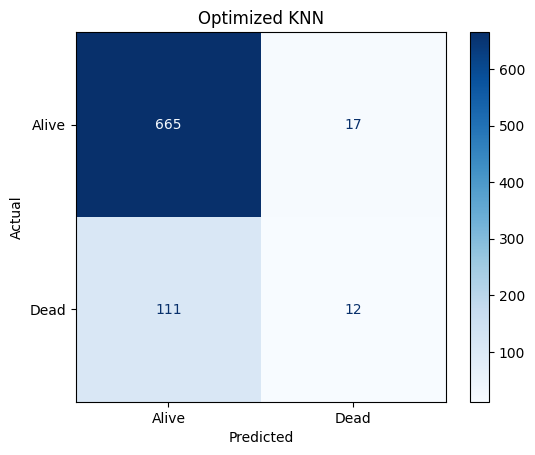

In [303]:
#Plot for each model
plot_confusion_matrix(y_test, y_pred_best_knn, "Optimized KNN")


Seminar session 3

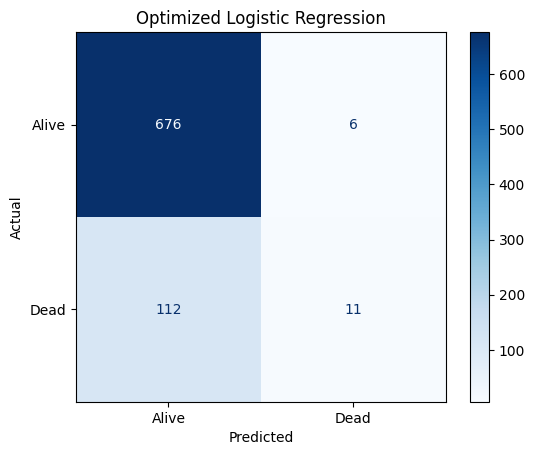

In [304]:
plot_confusion_matrix(y_test, y_pred_best_logreg, "Optimized Logistic Regression")


Seminar session 3

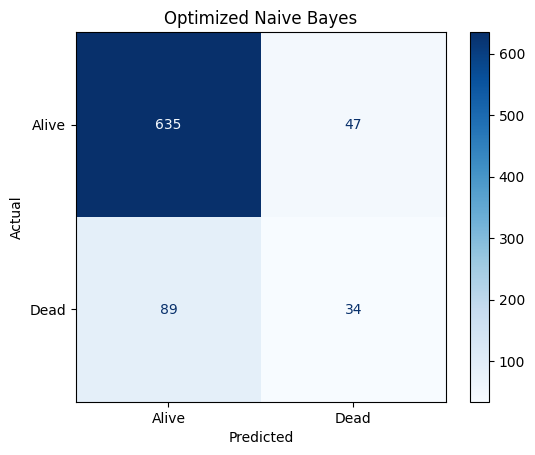

In [305]:
plot_confusion_matrix(y_test, y_pred_best_nb, "Optimized Naive Bayes")

Seminar session 3

In [306]:
from sklearn.metrics import RocCurveDisplay
import matplotlib.pyplot as plt

#Function to plot ROC curve
def plot_roc_curve(model, X_test, y_test, model_name):
    plt.figure(figsize=(8, 6))
    RocCurveDisplay.from_estimator(model, X_test, y_test, name=model_name)
    plt.title(f"ROC Curve for Optimized {model_name}")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
    plt.legend()
    plt.grid()
    plt.show()

Seminar session 3

<Figure size 800x600 with 0 Axes>

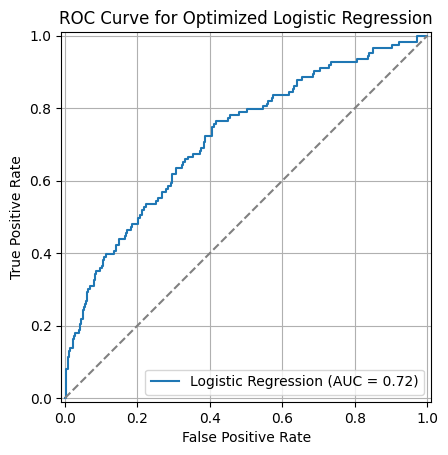

In [307]:
plot_roc_curve(best_logreg, X_test, y_test, "Logistic Regression")

Seminar session 3

<Figure size 800x600 with 0 Axes>

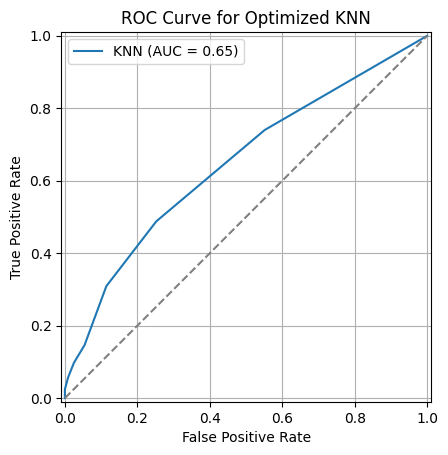

In [308]:
plot_roc_curve(best_knn, X_test, y_test, "KNN")

Seminar session 3

<Figure size 800x600 with 0 Axes>

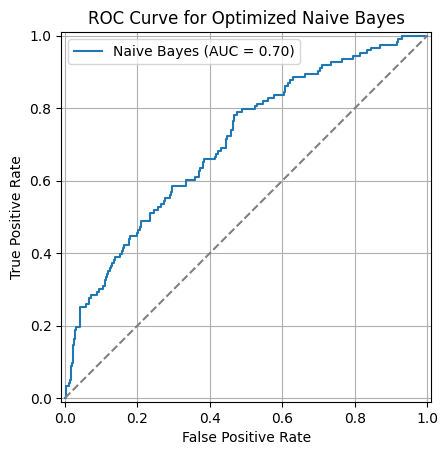

In [309]:
plot_roc_curve(best_nb, X_test, y_test, "Naive Bayes")

Seminar session 3 and 4

In [310]:
#KNN
print("KNN Classification Report:")
print(classification_report(y_test, y_pred_best_knn))

#Logistic Regression
print("\nLogistic Regression Classification Report:")
print(classification_report(y_test, y_pred_best_logreg))

KNN Classification Report:
              precision    recall  f1-score   support

           0       0.86      0.98      0.91       682
           1       0.41      0.10      0.16       123

    accuracy                           0.84       805
   macro avg       0.64      0.54      0.54       805
weighted avg       0.79      0.84      0.80       805


Logistic Regression Classification Report:
              precision    recall  f1-score   support

           0       0.86      0.99      0.92       682
           1       0.65      0.09      0.16       123

    accuracy                           0.85       805
   macro avg       0.75      0.54      0.54       805
weighted avg       0.83      0.85      0.80       805



Seminar session 8

In [311]:
#Voting Ensembled Learner
from sklearn.ensemble import VotingClassifier

#Create a dictionary of best 2 models
base_learners = [('KNN', knn_gscv.best_estimator_),('LR', logreg_gscv.best_estimator_)]

#Create voting classifier
ensemble_learner = VotingClassifier(base_learners, voting='soft')

Seminar session 8

In [312]:
#Fit model to training data
ensemble_learner = ensemble_learner.fit(X_train, y_train)
y_pred_ensembler = ensemble_learner.predict(X_test)

Seminar session 1, 2, 3, 4

In [313]:
#Classification report of Voting Classifier
print("Classification report for Ensmebler")
print(classification_report(y_test,y_pred_ensembler))

Classification report for Ensmebler
              precision    recall  f1-score   support

           0       0.86      0.98      0.92       682
           1       0.52      0.10      0.16       123

    accuracy                           0.85       805
   macro avg       0.69      0.54      0.54       805
weighted avg       0.81      0.85      0.80       805



Seminar session 1, 2, 3, 4 , 8

In [314]:
from sklearn.metrics import precision_score, recall_score, f1_score, roc_auc_score

#Accuracy
print("Voting Classifier Accuracy:", accuracy_score(y_test, y_pred_ensembler))

#Precision
print("Precision:", precision_score(y_test, y_pred_ensembler, average='binary'))

#Recall
print("Recall:", recall_score(y_test, y_pred_ensembler, average='binary'))

#F1 Score
print("F1 Score:", f1_score(y_test, y_pred_ensembler, average='weighted'))

#AUC-ROC
print("AUC-ROC:", roc_auc_score(y_test, y_pred_ensembler, average='weighted'))

Voting Classifier Accuracy: 0.8484472049689441
Precision: 0.5217391304347826
Recall: 0.0975609756097561
F1 Score: 0.8017215462718738
AUC-ROC: 0.5407159716758458


Seminar session 1, 2, 3, 4, 8

Confusion Matrix For Ensember Learner


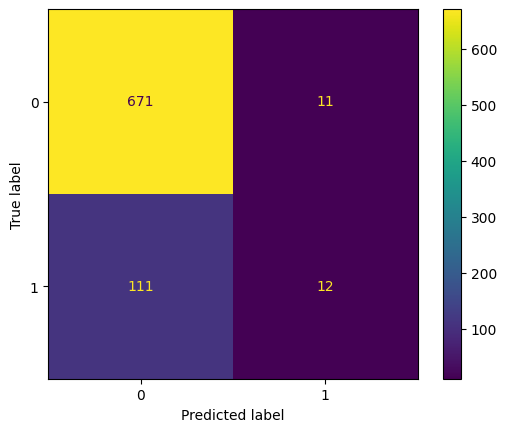

In [315]:
print("Confusion Matrix For Ensember Learner")
ensemble_learner_cm = confusion_matrix(y_test,y_pred_ensembler)
display = ConfusionMatrixDisplay(confusion_matrix = ensemble_learner_cm,display_labels = ensemble_learner.classes_)
display.plot()


Seminar session 3, 8

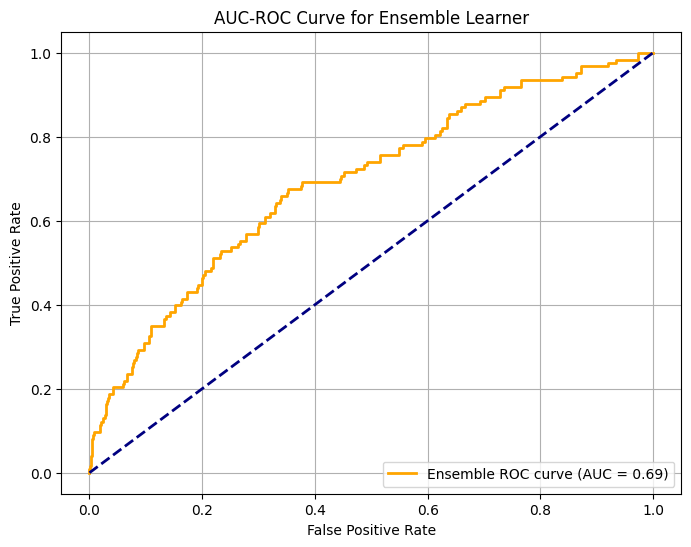

In [316]:
from sklearn.metrics import roc_curve, auc

#Get predicted probabilities for the positive class (class 1)
ensemble_probs = ensemble_learner.predict_proba(X_test)[:, 1]

#Compute False Positive Rate and True Positive Rate
fpr, tpr, _ = roc_curve(y_test, ensemble_probs)
roc_auc = auc(fpr, tpr)

#Plot the AUC-ROC Curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='orange', lw=2, label='Ensemble ROC curve (AUC = {:.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('AUC-ROC Curve for Ensemble Learner')
plt.legend(loc="lower right")
plt.grid(True)
plt.show()


Seminar session 1 and 2

In [317]:
#Reading regreesion dataset
data_frame2 = pd.read_csv('/content/drive/MyDrive/Regression_dataset.csv')

Seminar session 1 and 2

In [318]:
data_frame2.head()

,Age,Sex,T_Stage,N_Stage,6th_Stage,Differentiated,Grade,A_Stage,Tumor_Size,Estrogen_Status,Progesterone_Status,Regional_Node_Examined,Regional_Node_Positive,Survival_Months
0,68.0,0,0,0,0,1,3,1,4.0,1,1,24.0,1,60.0
1,50.0,0,1,1,2,0,2,1,35.0,1,1,14.0,5,62.0
2,58.0,0,2,2,4,0,2,1,63.0,1,1,14.0,7,75.0
3,58.0,0,0,0,0,1,3,1,18.0,1,1,2.0,1,84.0
4,47.0,0,1,0,1,1,3,1,41.0,1,1,3.0,1,50.0


Seminar session 1 and 2

In [319]:
data_frame2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4024 entries, 0 to 4023
Data columns (total 14 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Age                     4024 non-null   float64
 1   Sex                     4024 non-null   int64  
 2   T_Stage                 4024 non-null   int64  
 3   N_Stage                 4024 non-null   int64  
 4   6th_Stage               4024 non-null   int64  
 5   Differentiated          4024 non-null   int64  
 6   Grade                   4024 non-null   int64  
 7   A_Stage                 4024 non-null   int64  
 8   Tumor_Size              4024 non-null   float64
 9   Estrogen_Status         4024 non-null   int64  
 10  Progesterone_Status     4024 non-null   int64  
 11  Regional_Node_Examined  4024 non-null   float64
 12  Regional_Node_Positive  4024 non-null   int64  
 13  Survival_Months         4024 non-null   float64
dtypes: float64(4), int64(10)
memory usage: 4

Seminar session 1 and 2

In [320]:
print(data_frame2.shape)

(4024, 14)


Seminar session 1 and 2

In [321]:
print(data_frame2.columns)

Index(['Age', 'Sex', 'T_Stage', 'N_Stage', '6th_Stage', 'Differentiated',
       'Grade', 'A_Stage', 'Tumor_Size', 'Estrogen_Status',
       'Progesterone_Status', 'Regional_Node_Examined',
       'Regional_Node_Positive', 'Survival_Months'],
      dtype='object')


Seminar session 7

In [322]:
#Regression Decision Trees
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

Seminar session 7

In [323]:
#Defining targets
X2 = data_frame2.drop("Survival_Months", axis = 1)
y2 = data_frame2["Survival_Months"]

#Spliting data
X2_train, X2_test, y2_train, y2_test = train_test_split(X2, y2, test_size=0.2, random_state=42)

Seminar session 7

In [324]:
#Train fully grown decision tree
full_tree = DecisionTreeRegressor(random_state=42)
full_tree.fit(X2_train, y2_train)

DecisionTreeRegressor(random_state=42)

Seminar session 7

In [325]:
#Predict
y2_pred_full = full_tree.predict(X2_test)

#Evaluate
mae_full = mean_absolute_error(y2_test, y2_pred_full)
rmse_full = np.sqrt(mean_squared_error(y2_test, y2_pred_full))

Seminar session 7

In [326]:
#Full tree depth
print("The full Regression Decision Tree Levels: ", full_tree.tree_.max_depth)


The full Regression Decision Tree Levels:  29


Seminar session 7

In [327]:
print("Fully-Grown Tree Performance")
print("MAE:", mae_full)
print("RMSE:", rmse_full)

Fully-Grown Tree Performance
MAE: 25.343478260869563
RMSE: 31.825304397601606


Seminar session 7

In [328]:
#Plotting Decision Tree
from sklearn import tree

Unpruned_Tree_figure = plt.figure(figsize=(200,200))
DT_Graph = tree.plot_tree(full_tree, feature_names=list(X2_train.columns), class_names = ['0','1'], filled=True)

Seminar session 7

In [329]:
#Save the DT graph as a png image
Unpruned_Tree_figure.savefig("Unpruned_Tree_figure.png")

Seminar session 7

In [330]:
#Pruned DT
#Limiting the tree growth to 4 levels
pruned_tree = DecisionTreeRegressor(max_depth=4)
pruned_tree.fit(X2_train, y2_train)

DecisionTreeRegressor(max_depth=4)

Seminar session 7

In [331]:
#Predict
y_pred_pruned = pruned_tree.predict(X2_test)

Seminar session 7

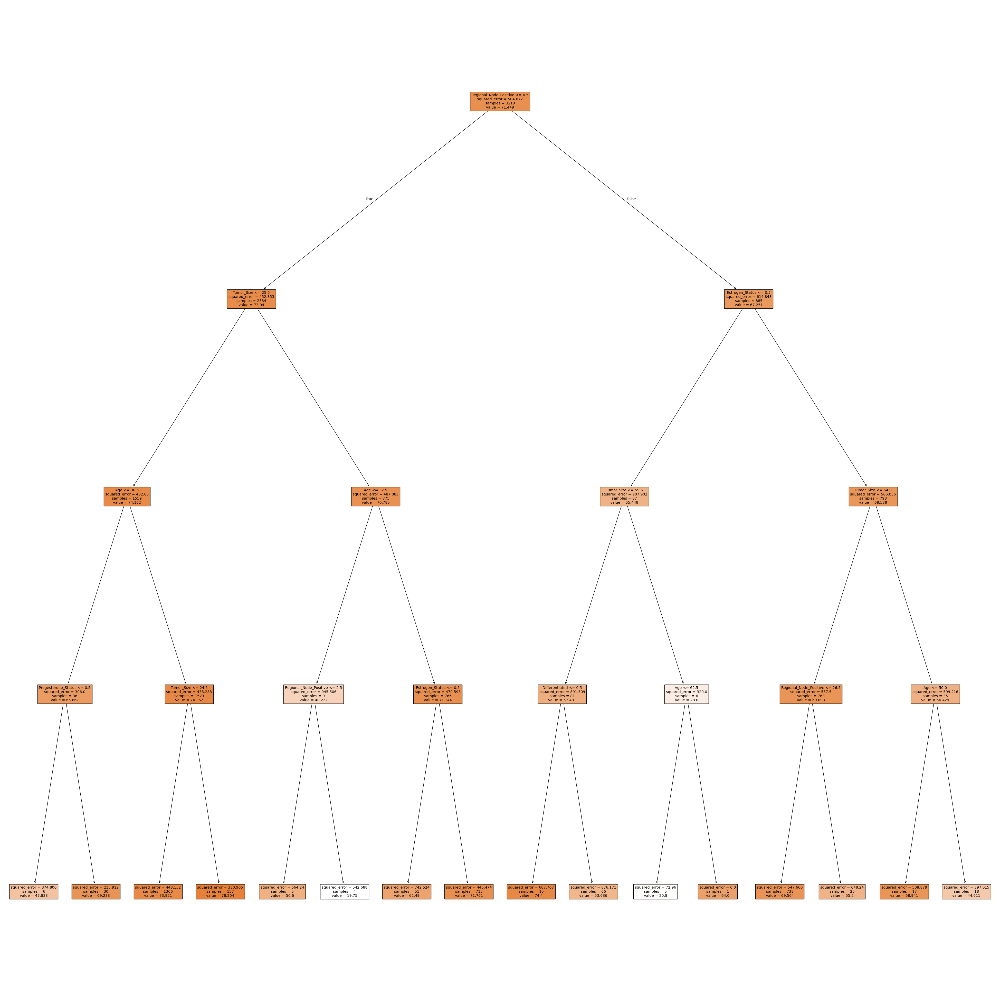

In [332]:
#Plot the Pruned DT
Pruned_Tree_Figure = plt.figure(figsize=(50,50))
Pruned_Tree_Figure_Graph = tree.plot_tree(pruned_tree, feature_names=list(X2_train.columns), filled=True)

Seminar session 7

In [333]:
#Save the DT graph as a png image
Pruned_Tree_Figure.savefig("Pruned_Tree_figure.png")

Seminar session 7

In [334]:
from sklearn import metrics

print("Unpruned Tree Metrics")
print('MAE:', metrics.mean_absolute_error(y2_test, y2_pred_full))
print('MSE:', metrics.mean_squared_error(y2_test, y2_pred_full))
print('R2:', metrics.r2_score(y2_test, y2_pred_full))

print("\nPruned Tree Metrics")
print('MAE:', metrics.mean_absolute_error(y2_test, y_pred_pruned))
print('MSE:', metrics.mean_squared_error(y2_test, y_pred_pruned))
print('R2:', metrics.r2_score(y2_test, y_pred_pruned))

Unpruned Tree Metrics
MAE: 25.343478260869563
MSE: 1012.85
R2: -1.0042117571631537

Pruned Tree Metrics
MAE: 18.081165795809387
MSE: 489.85757027798206
R2: 0.030677492534425088


Seminar session 7

In [335]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

#Define parameter grid
param_grid = {
    'max_depth': np.arange(1, 22),
    'criterion': ['squared_error'],
    'splitter': ['best', 'random']
}

#Initialize model and grid search
dt_regressor = DecisionTreeRegressor()
grid_search = GridSearchCV(estimator=dt_regressor, param_grid=param_grid, cv=5, n_jobs=-1, scoring='r2')

Seminar session 7

In [336]:
#Fit grid search to training data
grid_search.fit(X2_train, y2_train)

GridSearchCV(cv=5, estimator=DecisionTreeRegressor(), n_jobs=-1,
             param_grid={'criterion': ['squared_error'],
                         'max_depth': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21]),
                         'splitter': ['best', 'random']},
             scoring='r2')

Seminar session 7

In [337]:
#Get the best hyperparameters
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

Best Hyperparameters: {'criterion': 'squared_error', 'max_depth': np.int64(2), 'splitter': 'random'}


Seminar session 7

In [338]:
#Get the best model and make predictions
best_model = grid_search.best_estimator_
y_pred = best_model.predict(X2_test)

Seminar session 7

In [339]:
#Evaluate the best model
mae = mean_absolute_error(y2_test, y_pred)
mse = mean_squared_error(y2_test, y_pred)
r2 = r2_score(y2_test, y_pred)

print(f"MAE: {mae}")
print(f"MSE: {mse}")
print(f"R2: {r2}")

MAE: 17.924298153060526
MSE: 469.1947112625786
R2: 0.0715648351570013


#Case B) Task 4)

In [340]:
#Case B) Task 4)

feature_names = [
    'Age', 'Sex', 'T_Stage', 'N_Stage', '6th_Stage', 'Differentiated', 'Grade',
    'A_Stage', 'Tumor_Size', 'Estrogen_Status', 'Progesterone_Status',
    'Regional_Node_Examined', 'Regional_Node_Positive'
]

#Encode Patient B002565's data
patient_data = pd.DataFrame([[
    29,     #Age
    0,      #Sex (Female = 0)
    2,      #T_Stage (T3 = 2)
    0,      #N_Stage (N1 = 0)
    4,      #6th_Stage (IIIC = 4)
    0,      #Differentiated (Moderately differentiated = 0)
    2,      #Grade
    1,      #A_Stage (Regional = 1)
    41,     #Tumor_Size
    0,      #Estrogen_Status (Negative = 0)
    1,      #Progesterone_Status (Positive = 1)
    5,      #Regional_Node_Examined
    1       #Regional_Node_Positive
]], columns=feature_names)

In [341]:
#Predict survival months for patient B002565
predicted_survival = pruned_tree.predict(patient_data)
print(f"Predicted Survival Months for Patient B002565: {predicted_survival[0]:.2f}")


Predicted Survival Months for Patient B002565: 56.60
